In [1]:
import pandas as pd
from pathlib import Path
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.dates as mdates
import numpy as np
import sklearn
import statsmodels as sm
import seaborn as sns
import hvplot.pandas
import hvplot as hv






SUBTASK 1->Read the machine_temp_failure_missing.csv dataset into a Pandas DataFrame, must use PathLib. Inspect the dataset, and look for missing values if there are any. Find statistics such as mean, max, min. Rename the value column to temperature



In [2]:
location= Path('machine_temp_failure_missing.csv')
data = pd.read_csv(location)

In [3]:
print(data.shape)
data.head()

(22695, 2)


,timestamp,value
0,02-12-2013 21:15,73.967322
1,02-12-2013 21:20,74.935882
2,02-12-2013 21:25,76.124162
3,02-12-2013 21:30,78.140707
4,02-12-2013 21:35,79.329836


In [4]:
print(data.isnull().sum())
data.replace(0,np.NaN,inplace=True)
data.isna().sum()

timestamp       0
value        1285
dtype: int64


timestamp       0
value        1285
dtype: int64

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  22695 non-null  object 
 1   value      21410 non-null  float64
dtypes: float64(1), object(1)
memory usage: 354.7+ KB


In [6]:
data.describe(include="all")

,timestamp,value
count,22695,21410.000000
unique,22683,NaN
top,07-01-2014 02:45,NaN
freq,2,NaN
mean,NaN,85.968188
std,NaN,13.553070
min,NaN,2.084721
25%,NaN,83.082867
50%,NaN,89.251290
75%,NaN,93.910748


In [7]:
data.rename(columns={'value':'temperature'},inplace= True)

In [8]:
data.columns

Index(['timestamp', 'temperature'], dtype='object')

SUBTASK 2->•	Create a new feature delta_temperature which would be temp[i+1] - temp[i] where i is in range(Index). The feature represents the difference between consecutive temperature values

In [9]:
del_t=[]
for i in range(len(data.index)-1):
    del_t.append(data["temperature"][i+1]-data["temperature"][i])
del_t.append(data["temperature"][0]-data["temperature"][i])
data["delta_temperature"]=del_t  

In [10]:
data.columns

Index(['timestamp', 'temperature', 'delta_temperature'], dtype='object')

In [11]:
data.head()

,timestamp,temperature,delta_temperature
0,02-12-2013 21:15,73.967322,0.968560
1,02-12-2013 21:20,74.935882,1.188280
2,02-12-2013 21:25,76.124162,2.016546
3,02-12-2013 21:30,78.140707,1.189128
4,02-12-2013 21:35,79.329836,-0.619417


SUBTASK 3->•	Generate two separate plots for temperature and delta_temperature using both matplotlib and hvPlot  

In [12]:
plt.style.use("seaborn-dark")
from matplotlib.pyplot import figure

C:\Users\Alt\AppData\Local\Temp\ipykernel_14352\2630011822.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-dark")


<function matplotlib.pyplot.show(close=None, block=None)>

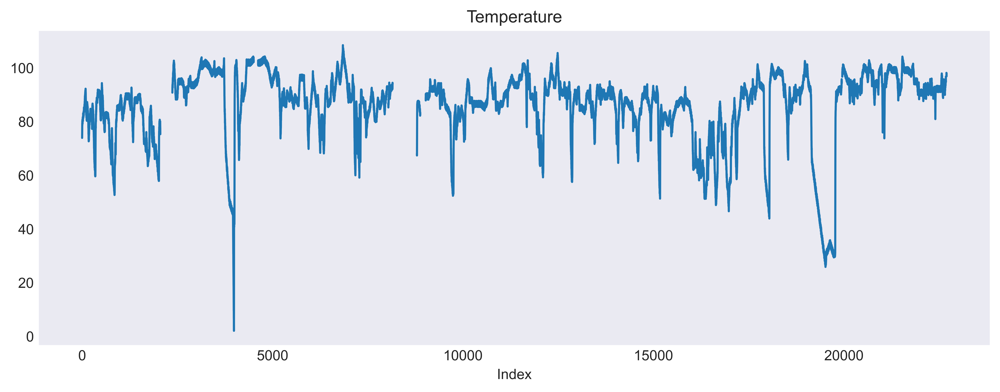

In [13]:
figure(figsize=(12,4),dpi=1000)
plot = data.temperature.plot(
    xlabel="Index",
    title ="Temperature"
)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

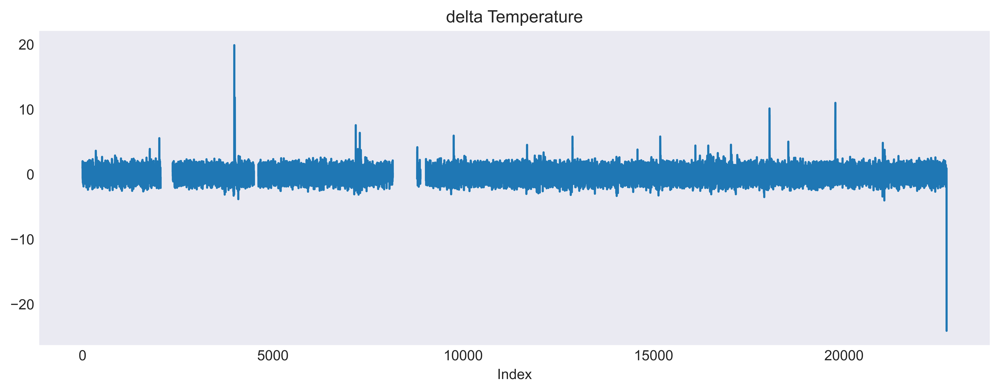

In [14]:
figure(figsize=(12,4),dpi=1000)
plot = data.delta_temperature.plot(
    xlabel="Index",
    title ="delta Temperature"
)
plt.show

In [15]:
hv.extension('bokeh')
from bokeh.plotting import show


In [16]:
plot1 = data.hvplot(width=1000,x="index",y="temperature",xlabel="Index",ylabel="temp")

show(hv.render(plot1))
#plt.show()


In [17]:
plot2 = data.hvplot(width=1000,x="index",y="delta_temperature",xlabel="Index",ylabel="temp")
show(hv.render(plot2))

now plotting the same data but as Time Series

In [18]:
data_ts=data.copy()
data_ts["timestamp"]=pd.DatetimeIndex(data_ts.timestamp)
data_ts.set_index('timestamp',inplace=True)

<function matplotlib.pyplot.show(close=None, block=None)>

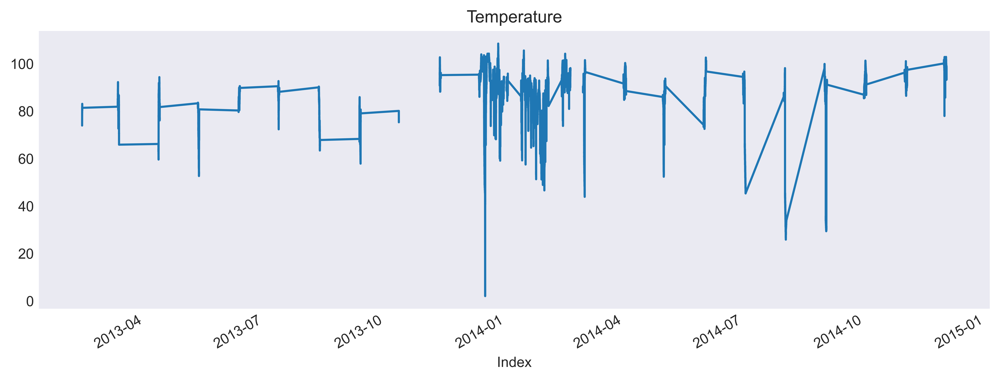

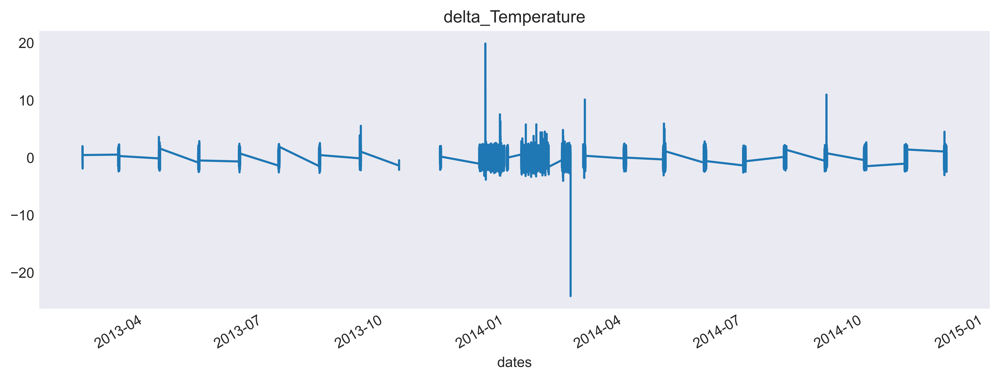

In [19]:
figure(figsize=(12,4),dpi=1000)
plot = data_ts.temperature.plot(
    xlabel="Index",
    title ="Temperature"
)
plt.show
figure(figsize=(12,4),dpi=1000)
plot = data_ts.delta_temperature.plot(
    xlabel="dates",
    title ="delta_Temperature"
)
plt.show

In [20]:
data_ts.head()

,temperature,delta_temperature
timestamp,,
2013-02-12 21:15:00,73.967322,0.968560
2013-02-12 21:20:00,74.935882,1.188280
2013-02-12 21:25:00,76.124162,2.016546
2013-02-12 21:30:00,78.140707,1.189128
2013-02-12 21:35:00,79.329836,-0.619417


In [21]:
plot2=data_ts.hvplot(subplots=True)
show(hv.render(plot2)
)


**SUBTASK 4 ->•	Generate a plot in which temperature values greater than 70.00 are marked as red, and those below 70.00 are marked as blue. **

In [22]:
data_ts.index

DatetimeIndex(['2013-02-12 21:15:00', '2013-02-12 21:20:00',
               '2013-02-12 21:25:00', '2013-02-12 21:30:00',
               '2013-02-12 21:35:00', '2013-02-12 21:40:00',
               '2013-02-12 21:45:00', '2013-02-12 21:50:00',
               '2013-02-12 21:55:00', '2013-02-12 22:00:00',
               ...
               '2014-02-19 14:40:00', '2014-02-19 14:45:00',
               '2014-02-19 14:50:00', '2014-02-19 14:55:00',
               '2014-02-19 15:00:00', '2014-02-19 15:05:00',
               '2014-02-19 15:10:00', '2014-02-19 15:15:00',
               '2014-02-19 15:20:00', '2014-02-19 15:25:00'],
              dtype='datetime64[ns]', name='timestamp', length=22695, freq=None)

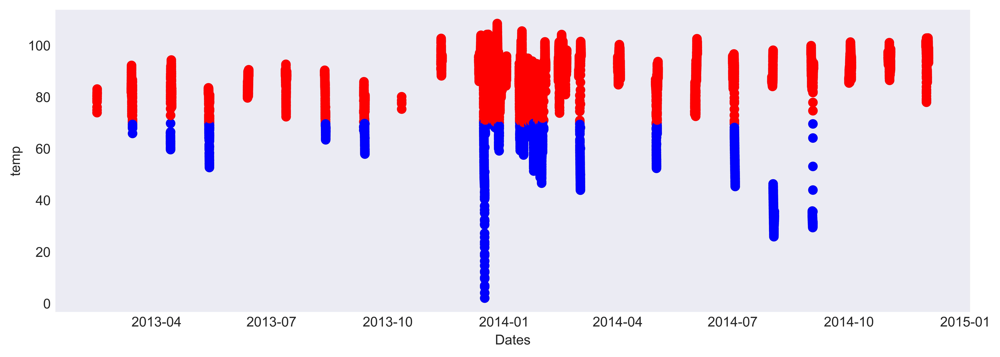

<function matplotlib.pyplot.show(close=None, block=None)>

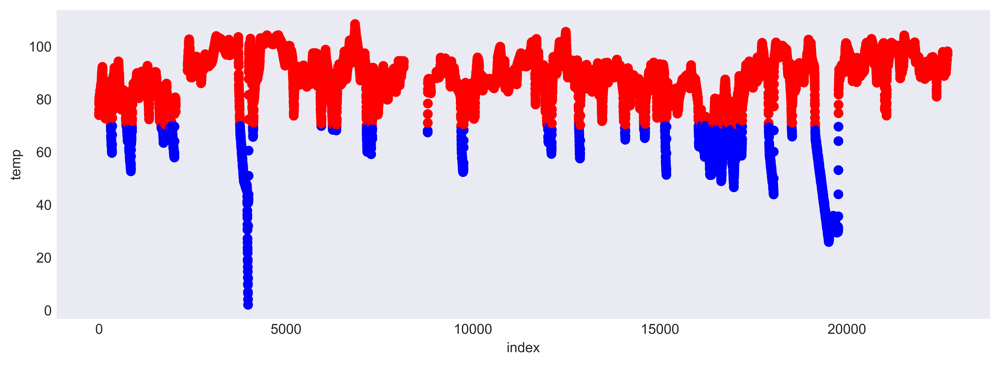

In [23]:
colours=['red' if temp>70.00 else 'blue' for temp in data["temperature"]]
figure(figsize=(12,4),dpi=1000)
plt.scatter(data_ts.index,data_ts["temperature"],c=colours)
plt.xlabel('Dates')
plt.ylabel('temp')
plt.show()
figure(figsize=(12,4),dpi=1000)
plt.scatter(data.index,data["temperature"],c=colours)
plt.xlabel('index')
plt.ylabel('temp')
plt.show


SUBTASK 5->•	Write three functions read_datasets(), plot_dfs(), rmse_score() for these datasets (as discussed in 1_4 notebook).

In [24]:
def read_dataset(folder, file, date_col=None):
    '''
    folder: is a Path object
    file: the CSV filename in that Path object. 
    date_col: specify a date_col to use as index_col 
    
    returns: a pandas DataFrame with a DatetimeIndex
    '''
    df = pd.read_csv(folder / file)
    df["timestamp"]=pd.DatetimeIndex(df.timestamp)
    df.set_index('timestamp',inplace=True)
    return df


In [25]:
def plot_dfs(df1, df2, col, title=None, xlabel=None, ylabel=None):
    '''	
    df1: original dataframe without missing data
    df2: dataframe with missing data
    col: column name that contains missing data
    '''    
    df_missing = df2.rename(columns={col: 'missing'})
    
    columns = df_missing.loc[:, 'missing':].columns.tolist()
    subplots_size = len(columns)
    
    # subplots_size = df2.shape[1]
    fig, ax = plt.subplots(subplots_size+1, 1, sharex=True)
    plt.subplots_adjust(hspace=0.25)
    fig.suptitle = title 
    
    df1[col].plot(ax=ax[0], figsize=(15, 16))
    ax[0].set_title('Original Dataset')
    ax[0].set_xlabel(xlabel)
    ax[0].set_ylabel(ylabel)    
    
    for i, colname in enumerate(columns):
        df_missing[colname].plot(ax=ax[i+1])
        ax[i+1].set_title(colname)

    plt.show()

In [26]:
def rmse_score(df1, df2, col=None):
    '''
    df1: original dataframe without missing data
    df2: dataframe with missing data
    col: column name that contains missing data

    returns: a list of scores
    '''
    df_missing = df2
    columns = df_missing.loc[:, 'temperature':].columns.tolist()
    scores = []
    for comp_col in columns[1:]:
        rmse = ((df_missing[comp_col] - df1["temperature"]) ** 2).mean() ** .5
        scores.append(rmse)
        print(f'RMSE for {comp_col}: {rmse}')
    return scores

SUBTASK 6->•	Perform univariate imputation on temperature and  using Pandas (mean, ffill, bfill) and Scikit-Learn (SimpleImputer), and interpolation. Compare the RMSE score for each imputation with machine_temp_failure_original.csv  and find the method with the least RMSE score.

In [27]:
folder= Path('C:/Users/Alt/Downloads')

original= read_dataset(folder,"machine_temp_failure_original.csv","timestamp")
missing = read_dataset(folder,"machine_temp_failure_missing.csv","timestamp")
original.rename(columns={'value':'temperature'},inplace=True)
missing.rename(columns={'value':'temperature'},inplace=True)
missing.replace(0, np.NaN, inplace=True)
sample=missing.copy()

In [28]:
missing['mean'] = missing['temperature'].fillna(missing['temperature'].mean())
missing['ffill'] = missing['temperature'].fillna(method='ffill')
missing['bfill'] = missing['temperature'].fillna(method='bfill')

In [29]:
from sklearn.impute import SimpleImputer
strategy = [
    ('Mean Strategy', 'mean'),
    ('Median Strategy', 'median'),
    ('Most Frequent Strategy', 'most_frequent')]

vals = missing['temperature'].values.reshape(-1,1)


for s_name, s in strategy:
    missing[s_name] = (
        SimpleImputer(strategy=s).fit_transform(vals))

In [30]:
missing["linear"] = missing['temperature'].interpolate(method="linear")

In [31]:
_ = rmse_score(original, 
                    missing, 
                    'temperature')

RMSE for mean: 2.6118121108260417
RMSE for ffill: 1.4666115658526897
RMSE for bfill: 5.538329974927272
RMSE for Mean Strategy: 2.6118121108260417
RMSE for Median Strategy: 2.0176725629240635
RMSE for Most Frequent Strategy: 22.936820075564288
RMSE for linear: 3.4745265473020495


FFILL GIVES THE LEAST RMSE

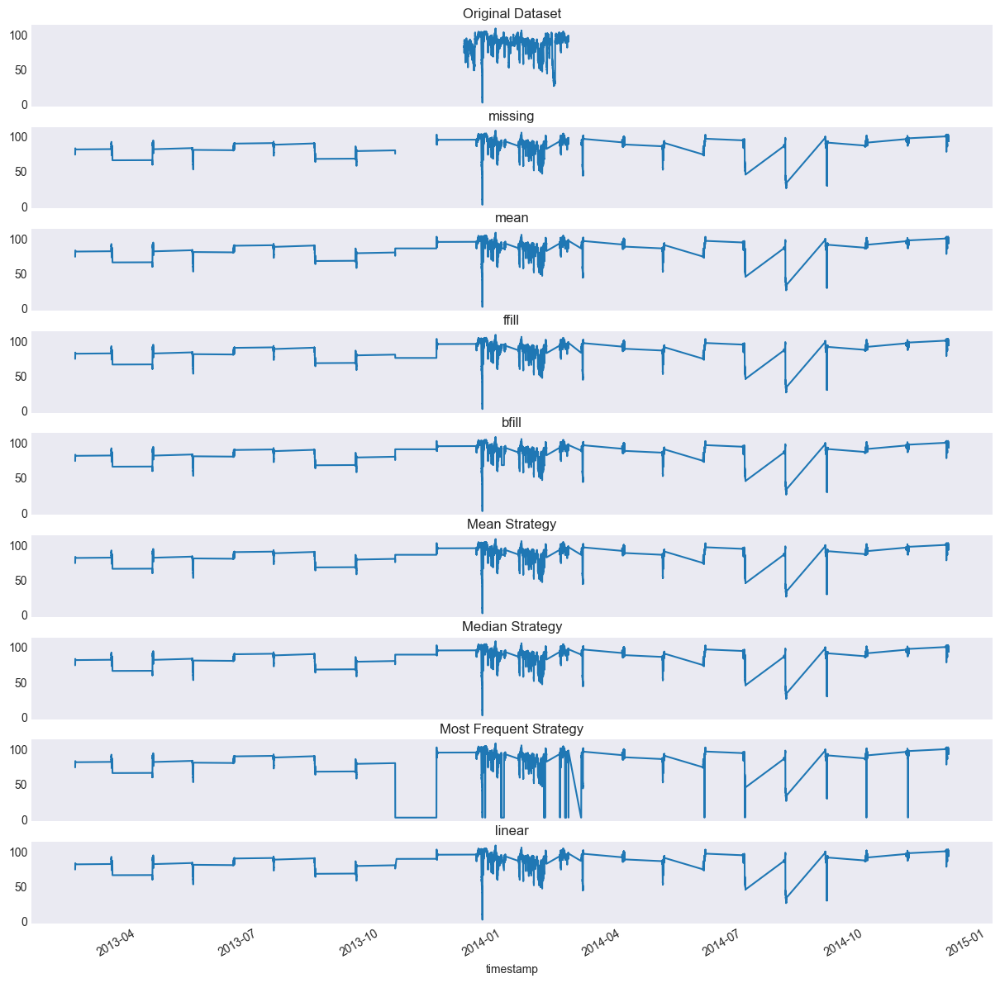

In [32]:
plot_dfs(original,missing,'temperature')

•	SUBTASK 7->Now the dataset will have no missing values. Check the frequency of data and resample the dataset to an hourly frequency.

In [33]:
original.value_counts()

temperature
2.084721       1
92.166520      1
92.138276      1
92.138105      1
92.137845      1
              ..
85.873784      1
85.870652      1
85.870455      1
85.869882      1
108.510543     1
Name: count, Length: 22695, dtype: int64

In [34]:
sample.ffill()

,temperature
timestamp,
2013-02-12 21:15:00,73.967322
2013-02-12 21:20:00,74.935882
2013-02-12 21:25:00,76.124162
2013-02-12 21:30:00,78.140707
2013-02-12 21:35:00,79.329836
...,...
2014-02-19 15:05:00,98.185415
2014-02-19 15:10:00,97.804168
2014-02-19 15:15:00,97.135468


In [35]:
sample.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 22695 entries, 2013-02-12 21:15:00 to 2014-02-19 15:25:00
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   temperature  21410 non-null  float64
dtypes: float64(1)
memory usage: 870.6 KB


In [36]:
sample.resample('60T').mean()

,temperature
timestamp,
2013-02-12 21:00:00,78.011596
2013-02-12 22:00:00,80.598012
2013-02-12 23:00:00,81.625018
2013-02-13 00:00:00,NaN
2013-02-13 01:00:00,NaN
...,...
2014-12-02 19:00:00,97.351702
2014-12-02 20:00:00,94.759885
2014-12-02 21:00:00,98.165799


SUBTASK 8->•	Draw box plot, boxen plot, lag plot and write your conclusions about outliers (in your own language). Define iqr_outliers() function for this data, and find the outliers. Compute z-score and plot z-score as discussed in the notebooks

In [37]:
sample.head()
sample.isna().sum()

temperature    1285
dtype: int64

[Text(0.5, 1.0, 'BOX PLOT')]

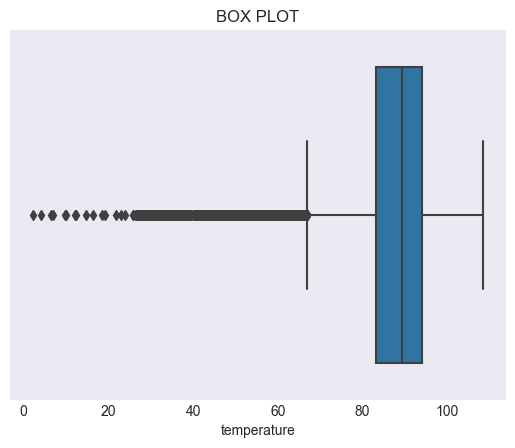

In [38]:
sns.boxplot(x=sample['temperature'], whis=1.5).set(title="BOX PLOT")

[Text(0.5, 1.0, 'BOXEN PLOT')]

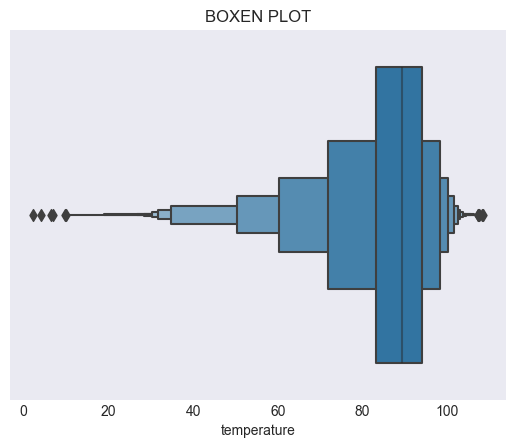

In [39]:
sns.boxenplot(x=sample['temperature'],).set(title="BOXEN PLOT")

[Text(0.5, 1.0, 'LAG PLOT')]

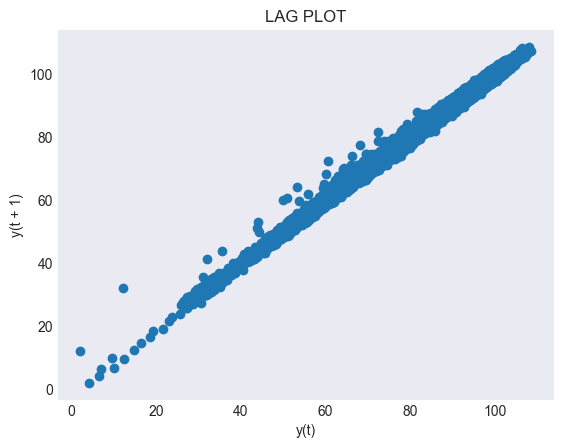

In [40]:
from pandas.plotting import lag_plot
lag_plot(sample, lag=1,).set(title="LAG PLOT")

In [41]:
percentiles = [0, 0.05, .10, .25, .5, .75, .90, .95, 1]
sample.describe(percentiles= percentiles)

,temperature
count,21410.000000
mean,85.968188
std,13.553070
min,2.084721
0%,2.084721
5%,57.308113
10%,67.624752
25%,83.082867
50%,89.251290
75%,93.910748


In [42]:
def plot_outliers(outliers, data, method='KNN',
                 halignment = 'right', 
                 valignment = 'bottom',
                 labels=False):

    ax = data.plot(alpha=0.6,figsize=(12,4))
    
    if labels:
        for i in outliers['temperature'].items():
            plt.plot(i[0], i[1], 'rx')
            plt.text(i[0], i[1], f'{i[0].date()}', 
                         horizontalalignment=halignment,
                         verticalalignment=valignment)
    else:
        data.loc[outliers.index].plot(ax=ax, style='rx')
        
    
    plt.xlabel('date'); plt.ylabel('temperature')
    plt.legend(['temperature','outliers'])
    plt.show()

In [43]:
def iqr_outliers(data, p):
    q1, q3 = np.percentile(data, [10, 75])
    IQR = q3 - q1
    lower_fence = q1 - (p * IQR)
    upper_fence = q3 + (p * IQR)
    return data[(data.temperature > upper_fence) | (data.temperature < lower_fence)]

In [44]:
outliers = iqr_outliers(sample,1)
print(outliers)

Empty DataFrame
Columns: [temperature]
Index: []


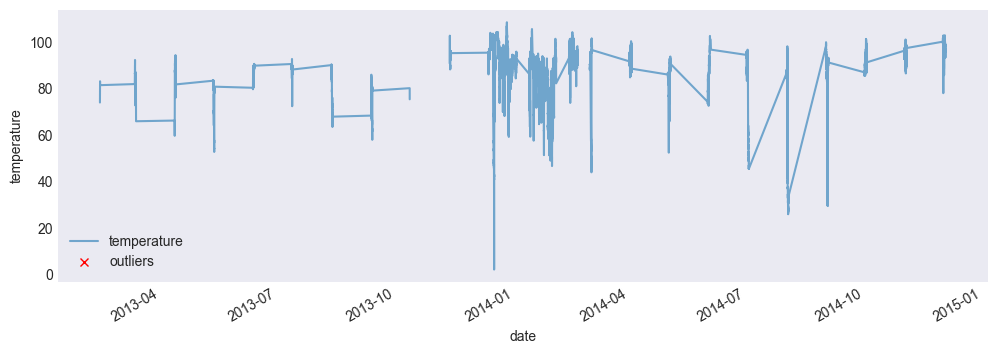

In [45]:

plot_outliers(outliers,sample,"using iqr")

In [46]:
def zscore(df, degree=3):
    data = df.copy()
    data['zscore'] = (data - data.mean())/data.std()
    outliers = data[(data['zscore'] <= -degree) | (data['zscore'] >= degree)]
    
    return outliers['temperature'], data

In [47]:
threshold = 2.5
outliers, transformed = zscore(sample, threshold)

In [48]:
print(outliers)

timestamp
2013-12-16 06:30:00    52.012468
2013-12-16 06:40:00    51.438116
2013-12-16 06:45:00    51.464206
2013-12-16 07:00:00    50.450564
2013-12-16 07:05:00    51.222821
                         ...    
2014-09-02 11:35:00    31.086225
2014-09-02 11:40:00    30.938861
2014-09-02 11:45:00    30.975528
2014-09-02 11:50:00    35.624129
2014-09-02 11:55:00    43.971303
Name: temperature, Length: 753, dtype: float64


In [49]:
def plot_zscore(data, d=3):
    n = len(data)
    plt.figure(figsize=(12,6))
    plt.plot(data,'k^')
    plt.plot([0,n],[d,d],'r--')
    plt.plot([0,n],[-d,-d],'r--')

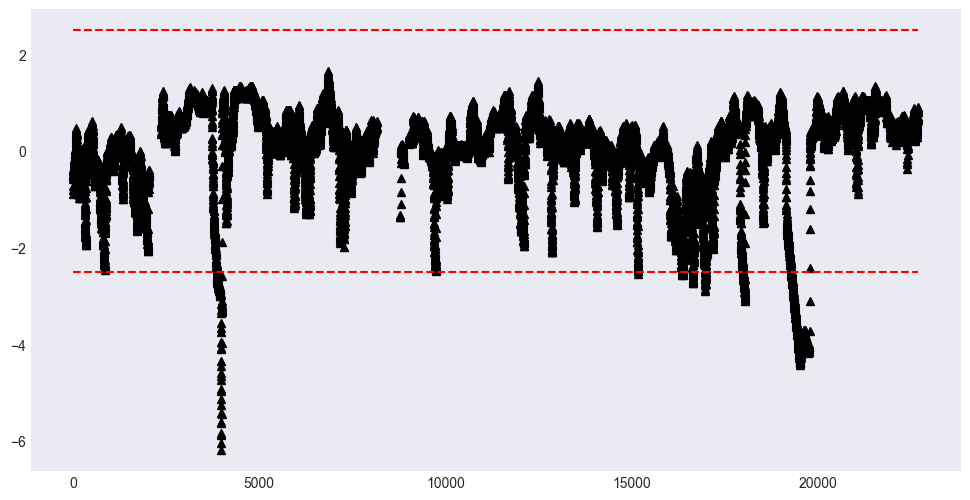

In [50]:
data = transformed['zscore'].values
plot_zscore(data, d=2.5)

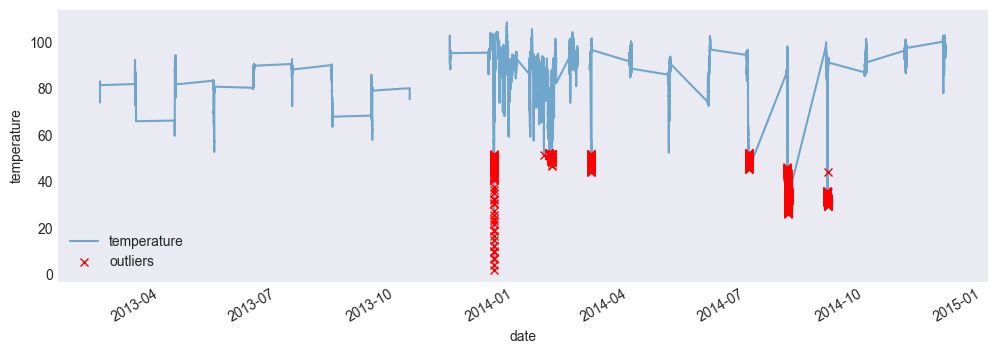

In [51]:
plot_outliers(outliers,sample, 'Outliers using Z-score')

WE CAN SEE THAT MOST OF THE OUTLIERS LIE BELOW THE TEMP OF 45 TO 50 DEGREES.
LOWER RANGES TEMP MOSTLY DIFFER FROM THE REST OF THE TIMESERIES DATA EXPECT FOR COUPLE OF TIMESTAMPS .